In [1]:
from ProjectRoot import change_wd_to_project_root 
change_wd_to_project_root()
%matplotlib inline
%reload_ext autoreload
%autoreload 2
import matplotlib
matplotlib.rcParams.update({'font.size': 22})
from src.utils.notebook_imports import *
from src.utils.Tensorflow_helper import choose_gpu_by_id
Console_and_file_logger('model_layer_output')

gpu_id = '1'
current_gpu = choose_gpu_by_id(gpu_id)

from src.models.ModelManager import load_pretrained_model
from sklearn.model_selection import train_test_split

import tensorflow.keras
from keras.models import Model
import src.utils.my_metrics as metr
from skimage.transform import resize
from src.models.ModelManager import create_2d_unet
from src.data.generators import DataGenerator
from src.data.dataset import get_img_msk_files_from_split_dir
from src.visualization.visualize import show_slice_transparent, show_slice, show_2D_or_3D

search for root_dir and set working directory
Working directory set to: /mnt/data/git/cardio


2020-01-20 11:47:41,869 INFO -------------------- Start --------------------
2020-01-20 11:47:41,869 INFO Working directory: /mnt/data/git/cardio.
2020-01-20 11:47:41,869 INFO Log file: ./logs/model_layer_output.log
Using TensorFlow backend.


# Load a pretrained model

In [7]:
# load a pretrained model
@interact
def interact_load_pretrained_model(config_file=sorted(glob.glob('reports/configs/2D/acdc/finetune_new2/**/**/*.json',)), load=False):
    """
    load past config for model training 
    """
    metrics = [
    metr.bce_dice_jac_loss,
    metr.dice_coef,
    metr.dice_coef_labels,
    metr.dice_coef_background,
    metr.dice_coef_myo,
    metr.dice_coef_lv,
    metr.dice_coef_rv]
    LOSS_FUNCTION = keras.losses.categorical_crossentropy
    # load config with all params into global namespace
    if load:
        with open(config_file, encoding='utf-8') as data_file:
            config = json.loads(data_file.read())
        #globals()['MODEL_PATH'] = config['MODEL_PATH']
        logging.info('Experiment: {}'.format(config['EXPERIMENT']))
        logging.info('config:\n {}'.format(json.dumps(config, indent=4, sort_keys=True)))
        config['LOSS_FUNCTION'] =  LOSS_FUNCTION
        try:
            # load model
            globals()['model'] = load_pretrained_model(config, metrics)
            globals()['config'] = config
            #model.summary()
        except Exception as e:
            logging.error(str(e))

interactive(children=(Dropdown(description='config_file', options=('reports/configs/2D/acdc/finetune_new2/plus…

# Load 2D data
# Create a Datagenerator
# Build a model wrapper to output all layers

In [8]:
# create a batchgenerator
# load a real image
@interact
def load_data(dir='data/raw/ACDC/2D/val/', load=False):
    
    global model
    
    if load:
        images_f, masks_f = get_img_msk_files_from_split_dir('data/raw/ACDC/2D/val/')
        logging.info('loaded: {} files'.format(len(images_f)))

        #avoid augmentation and shuffle
        config['AUGMENT_GRID'] = False
        config['SHUFFLE'] = False
        config['BATCHSIZE'] = 64
        batch_generator = DataGenerator(images_f, masks_f, config)
        globals()['test_images'] = batch_generator.__getitem__(0)[0]

        # get all layers
        globals()['layers'] = [layer.name for layer in model.layers if 'input' not in layer.name]
        # work with multi-gpu models, extract the model
        if 'model_1' in layers:
            model = model.get_layer('model_1')
            globals()['model'] = model
            globals()['layers'] = [layer.name for layer in model.layers if 'input' not in layer.name]
        
        outputs = [model.get_layer(layer).output for layer in layers]

        # define a wrapper model to get the output of all layers
        globals()['model_all_layers'] = Model(inputs=model.get_input_at(0),outputs=outputs)

interactive(children=(Text(value='data/raw/ACDC/2D/val/', description='dir'), Checkbox(value=False, descriptio…

# Predict on the original model and the wrapper

In [9]:
# get output of all layers for test data
pred_all_layers = model_all_layers.predict(test_images)

# get the output of the original model for the test data
pred = model.predict(test_images)

In [6]:
model_base = model
images = test_images.copy()
embedding = pred_all_layers.copy()

In [10]:
model5 = model

In [23]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

# Plot one featuremap per layer

In [24]:
# print the first featuremap for each layers of the model for one image
@interact
def show_one_featuremap_per_layer(img=(0,test_images.shape[0]), plot=False):
    show_2D_or_3D(test_images[img,:,:,0],  mask=pred[img,...])
    plt.rcParams.update({'font.size':25})
    if plot:
        #img = 0
        ncols = 7
        nrows = int(len(pred_all_layers)/ncols) +1

        # create a grid
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 5))
        axes = axes.flatten()

        # show input image
        axes[0].imshow(test_images[img,:,:,0])
        axes[0].set_title('Input image {}'.format(img))

        # show ouput image
        axes[1].imshow(show_slice(mask=pred[img,...], show=False))
        axes[1].set_title('output mask {}'.format(img))

        # show one image output of all layers
        for layer_name, output, ax in zip(layers, pred_all_layers, axes[2:]):
            ax.imshow(output[img,:,:,0])
            
            #ax.set_title('layer: {} \n shape: {}'.format(layer_name, output.shape),fontsize=18, ha='center')
        plt.tight_layout()
        plt.savefig('reports/featuremaps/2D_unet_layers.pdf')

interactive(children=(IntSlider(value=32, description='img', max=64), Checkbox(value=False, description='plot'…

# Visualize n featuremaps per layer

In [11]:
# print all layers output for one image
@interact_manual
def show_n_featuremaps_per_layer(img=(0,test_images.shape[0]), 
                                 features_per_layer = (1, 20),
                                save_dir='reports/featuremaps/2D_unet_layers_acdc.png',
                                save=False):

    show_2D_or_3D(test_images[img,:,:,0],  mask=pred[img,...])
    
    #img = 0
    ncols = features_per_layer
    nrows = len(pred_all_layers)

    # create a grid
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 5))
    axes = axes.flatten()

    # show output of all layers
    ax_idx = 0

    for layer_name, output in zip(layers, pred_all_layers): # traverse through all layers output tensors
        for c in range(features_per_layer): # get 10 examples of each layer if possible

            if c < output.shape[-1]: # make sure the current output tensor has enough feature maps

                try:
                    axes[ax_idx].imshow(output[img,:,:,c])
                    axes[ax_idx].set_title('layer:{}, c:{} \n shape:{}'.format(layer_name, c, output.shape),fontsize=18, ha='center')
                except Exception as e:
                    print(str(e))

            # increase ax-id to make sure we get a new line for each model layer
            ax_idx += 1
    plt.tight_layout()
    if save:
        ensure_dir(os.path.dirname(os.path.abspath(save_dir)))
        plt.savefig(save_dir)

interactive(children=(IntSlider(value=32, description='img', max=64), IntSlider(value=10, description='feature…

In [22]:
# print all featuremaps for one layer for one image
@interact
def create_n_featuremaps_for_layer(img=(0,test_images.shape[0]), 
                                 features_per_layer = (1, 20),
                                 layer=(0,len(pred_all_layers) - 1),
                                 plot=False,
                                save_dir='reports/featuremaps/extract_10/replace.pdf',
                                save=False):

    show_2D_or_3D(test_images[img,:,:,0],  mask=pred[img,...])
    plt.rcParams.update({'font.size':15})
    if plot:
        layer_name = layers[layer]
        output = pred_all_layers[layer]
        
        features = min(features_per_layer, output.shape[-1])
        
        #img = 0
        size_per_feature = 3
        fontsize = 15
        cols = 5
        ncols = cols
        nrows = int(np.ceil(features/cols))

        # create a grid
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * size_per_feature, nrows * size_per_feature))
        axes = axes.flatten()

        # show output of all layers
        ax_idx = 0

        for c in range(features_per_layer): # get 10 examples of each layer if possible

            if c < output.shape[-1]: # make sure the current output tensor has enough feature maps

                try:
                    axes[ax_idx].imshow(output[img,:,:,c])
                    #axes[ax_idx].set_yticklabels([])
                    #axes[ax_idx].set_xticklabels([])
                    #axes[ax_idx].set_title('layer:{}, c:{} \n shape:{}'.format(layer_name, c, output.shape),fontsize=fontsize, ha='center')
                    #axes[ax_idx].set_title('dim:{}'.format(output.shape),fontsize=fontsize, ha='center')
                except Exception as e:
                    print(str(e))

            # increase ax-id to make sure we get a new line for each model layer
            ax_idx += 1
        plt.tight_layout()
        #plt.plot()
        if save:
            print(layer_name)
            save_dir = save_dir.replace('replace', 'layer{}_features{}'.format(layer, features))
            ensure_dir(os.path.dirname(os.path.abspath(save_dir)))
            plt.savefig(save_dir)

interactive(children=(IntSlider(value=32, description='img', max=64), IntSlider(value=10, description='feature…

In [12]:
@interact
def show_featuremaps(f = sorted(glob.glob('reports/featuremaps/layer*_features*.pdf')), width=600, height=600):
    from IPython.display import IFrame
    from IPython.display import display_pdf
    f = os.path.abspath(f)
    f = os.path.relpath(f)   
    
    from IPython.core.display import HTML
    def pdf(url):
        return HTML('<embed src="%s" type="application/pdf" width="100%%" height="600px" />' % url)
    print(f)
    #display(display_pdf(f))
    #display(IFrame('reports/featuremaps/layer0_features16.pdf', width=width, height=height))
    #display(pdf(f))
    #display(HTML('<embed src={} type="application/pdf" width="100%%" height="600px" />'.format(f)))
    display(display_pdf(f))

interactive(children=(Dropdown(description='f', options=('reports/featuremaps/layer0_features16.pdf', 'reports…

In [13]:
from IPython.display import display_pdf
from IPython.display import IFrame, Image
display("reports/featuremaps/2D_unet_layers_train_acdcplus150_eval_acdc_b0_image_12.png")
#IFrame('reports/featuremaps/layer0_features16.pdf', width=600, height=600)
Image(filename = "reports/featuremaps/2D_unet_layers_train_acdcplus150_eval_acdc_b0_image_12.png", width=100, height=100)

'reports/featuremaps/2D_unet_layers_train_acdcplus150_eval_acdc_b0_image_12.png'

# Tests with the featuremaps

# get the embedding of one image

In [5]:
# calc the l1 norm for one layer?
len(pred_all_layers)
pred_all_layers[0].shape

62

(128, 224, 224, 16)

In [34]:
images = test_images.copy()
embedding = pred_all_layers.copy()

In [11]:
images5 = test_images.copy()
embedding5 = pred_all_layers.copy()

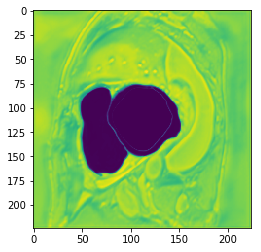

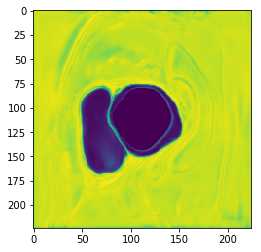

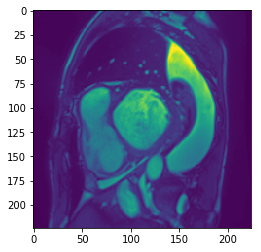

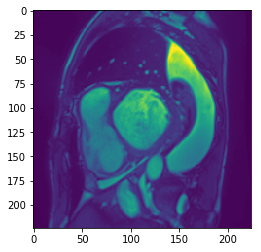

In [12]:
plt.imshow(embedding[-1][0,:,:,0], interpolation=None)
plt.show()
plt.imshow(embedding5[-1][0,:,:,0], interpolation =None)
plt.show()

plt.imshow(images[0,:,:,0])
plt.show()
plt.imshow(images5[0,:,:,0])
plt.show()

In [42]:
model5

In [52]:
len(model5.layers)

63

In [13]:
# calculate the MSE per layer between the weight matrices / filters
wdiff_relative = dict()
wdiff_sum = list()
weight_names = list()

for i in range(len(model_base.layers)):
    # calculate the difference of all weight matrices and all images, 
    # calculate the mean diff mean over the images
    layer = model_base.layers[i]
    layer5 = model5.layers[i]
    if 'conv' not in layer.name:
        continue
    l1, _ = layer.get_weights()
    l5, _ = layer5.get_weights()

    weight_names.append(layer.name)
    diff = ((l1 - l5)**2)
    print(layer.name)
    print(diff.shape)
    print(diff.size)
    # sum the diff up
    diff_sum = diff.sum()
    wdiff_sum.append(diff_sum)
    wdiff_relative[layer.name] = diff.flatten()
    #print('diff: {}'.format(diff_sum))
    #print('diff r: {}'.format(diff_r))
    #print('diff sum: {}'.format(diff_sum))

df_wdiff_relative = pd.DataFrame.from_dict(wdiff_relative, orient='index').T
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
sum_normed = min_max_scaler.fit_transform(np.array(wdiff_sum).reshape(-1, 1))[:,0]


conv2d_1
(3, 3, 1, 16)
144
conv2d_2
(3, 3, 16, 16)
2304
conv2d_3
(3, 3, 16, 32)
4608
conv2d_4
(3, 3, 32, 32)
9216
conv2d_5
(3, 3, 32, 64)
18432
conv2d_6
(3, 3, 64, 64)
36864
conv2d_7
(3, 3, 64, 128)
73728
conv2d_8
(3, 3, 128, 128)
147456
conv2d_9
(3, 3, 128, 256)
294912
conv2d_10
(3, 3, 256, 256)
589824
conv2d_11
(3, 3, 256, 128)
294912
conv2d_12
(3, 3, 256, 128)
294912
conv2d_13
(3, 3, 128, 128)
147456
conv2d_14
(3, 3, 128, 64)
73728
conv2d_15
(3, 3, 128, 64)
73728
conv2d_16
(3, 3, 64, 64)
36864
conv2d_17
(3, 3, 64, 32)
18432
conv2d_18
(3, 3, 64, 32)
18432
conv2d_19
(3, 3, 32, 32)
9216
conv2d_20
(3, 3, 32, 16)
4608
conv2d_21
(3, 3, 32, 16)
4608
conv2d_22
(3, 3, 16, 16)
2304
conv2d_23
(1, 1, 16, 4)
64


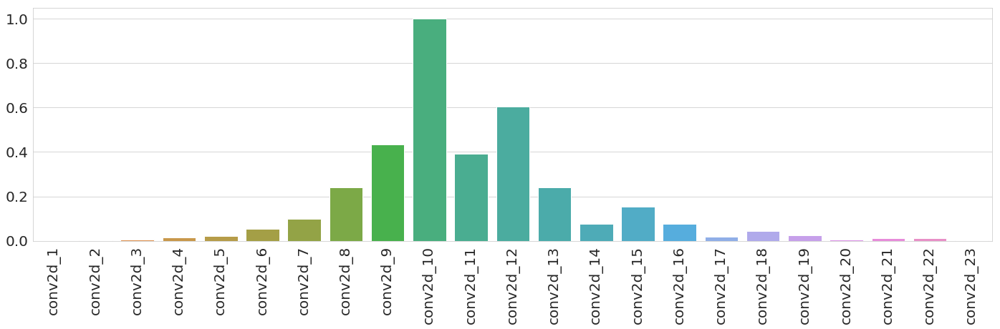

In [14]:

plt.rcParams.update({'font.size':20})
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(24,6))
g = sns.barplot(weight_names, sum_normed , ax=ax)
_ =g.set_xticklabels(g.get_xticklabels(), rotation=90)
g.figure.savefig('reports/wsum.pdf', bbox_inches="tight")

In [276]:
import matplotlib.pyplot as plt

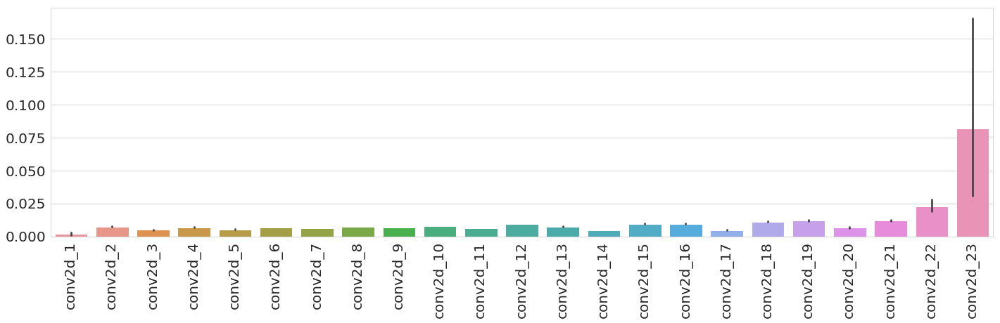

In [15]:

sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(24,6))
plt.rcParams.update({'font.size':20})
g = sns.barplot(data=df_wdiff_relative, ax=ax, label='big')
_ =g.set_xticklabels(g.get_xticklabels(), rotation=90)
#g.set_yscale("log")
g.figure.savefig('reports/wrelative.pdf', bbox_inches="tight")

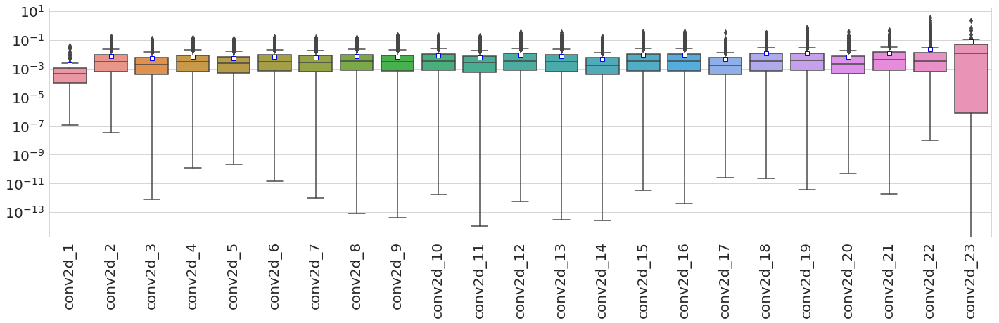

In [21]:
plt.rcParams.update({'font.size':20})
#sns.set({'font.size':20})
#sns.set_style("whitegrid")
#sns.set_context("notebook")
fig, ax = plt.subplots(1,1, figsize=(24,6))
#_ = ax.set(ylim=(0.000001, 0.5))
g = sns.boxplot(data=df_wdiff_relative, showmeans=True, meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue"}, ax=ax)
_ =g.set_xticklabels(g.get_xticklabels(), rotation=90)
g.set_yscale("log")

g.figure.savefig('reports/wrelative.pdf', bbox_inches="tight")

In [231]:

# calculate the layer specific differences between the featuremaps
diff_relative = list()
diff_r_dict = dict()
diff_sum = list()
layers_filtered = list()

for l, l5, lname in zip(embedding, embedding5, layers):
    # calculate the difference of all featuremaps and all images, 
    # calculate the mean diff mean over the images
    diff = ((l - l5)**2)
    #print(diff.shape)
    #print(diff.size)
    # sum the diff up
    if 'drop' in lname or 'batch' in lname:
        continue
    layers_filtered.append(lname)
    # average over the images
    diff_m = diff.mean(axis=0)
    diff_s = diff_m.sum()
    diff_sum.append(diff_s)
    #print(diff_temp.shape)
    diff_temp = diff_m.mean(axis=(0,1))
    #print(diff_temp.shape)
    diff_r_dict[lname] = diff_temp.flatten()
    # mean over the images

    #print(diff_r)
    #print(diff_temp.shape)

# normalize the differences per layer to values between 0 and 1
df_fdiff_relative = pd.DataFrame.from_dict(diff_r_dict, orient='index').T
diff_sum = (diff_sum-min(diff_sum))/(max(diff_sum)-min(diff_sum))


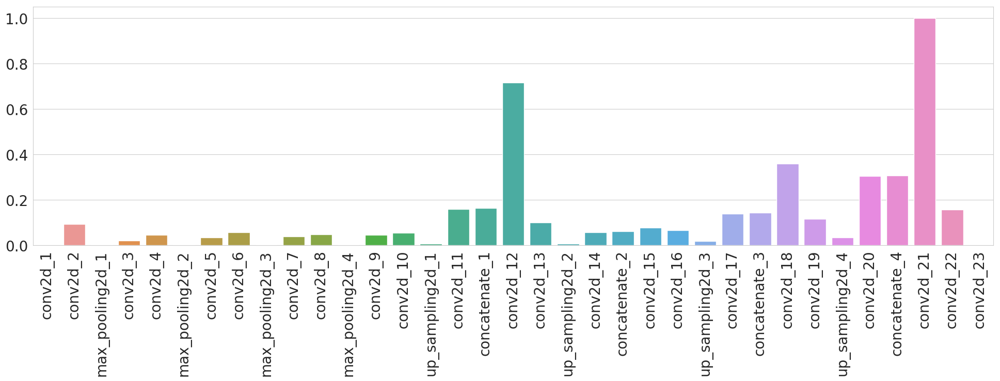

In [226]:
plt.rcParams.update({'font.size':20})
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(24,6))
g = sns.barplot(layers_filtered, diff_sum , ax=ax)
_ =g.set_xticklabels(g.get_xticklabels(), rotation=90)
_ =g.figure.savefig('reports/fsum.pdf', bbox_inches="tight")

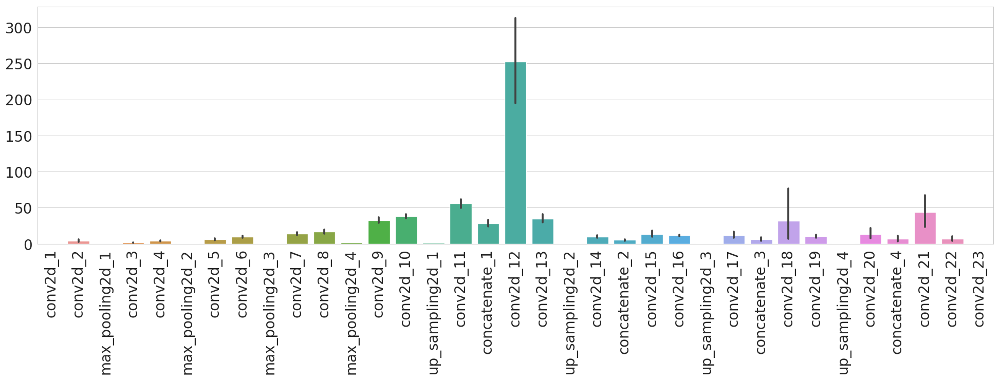

In [227]:
plt.rcParams.update({'font.size':20})
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(24,6))
g = sns.barplot(data=df_fdiff_relative, ax=ax)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=90)
#g.set_yscale("log")
g.figure.savefig('reports/frelative.pdf', bbox_inches="tight")

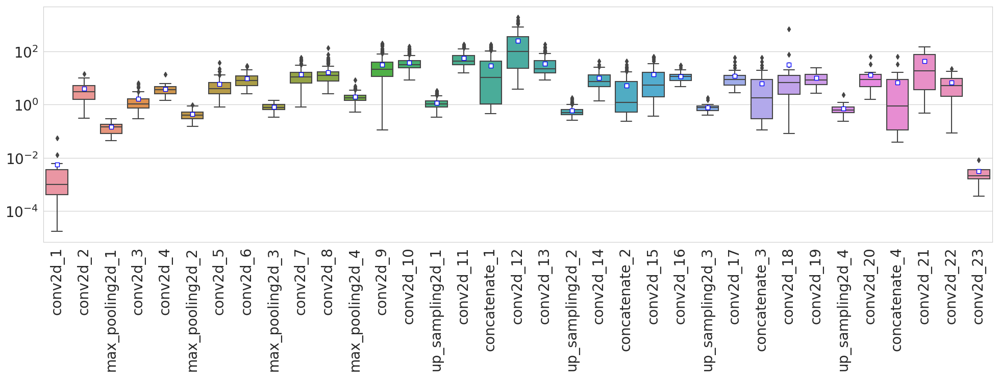

In [239]:
plt.rcParams.update({'font.size':20})
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,1, figsize=(24,6))
g = sns.boxplot(data=df_fdiff_relative, showmeans=True, meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue"}, ax=ax)
_ = g.set_xticklabels(g.get_xticklabels(), rotation=90)
g.set_yscale("log")
g.figure.savefig('reports/frelative.pdf', bbox_inches="tight")

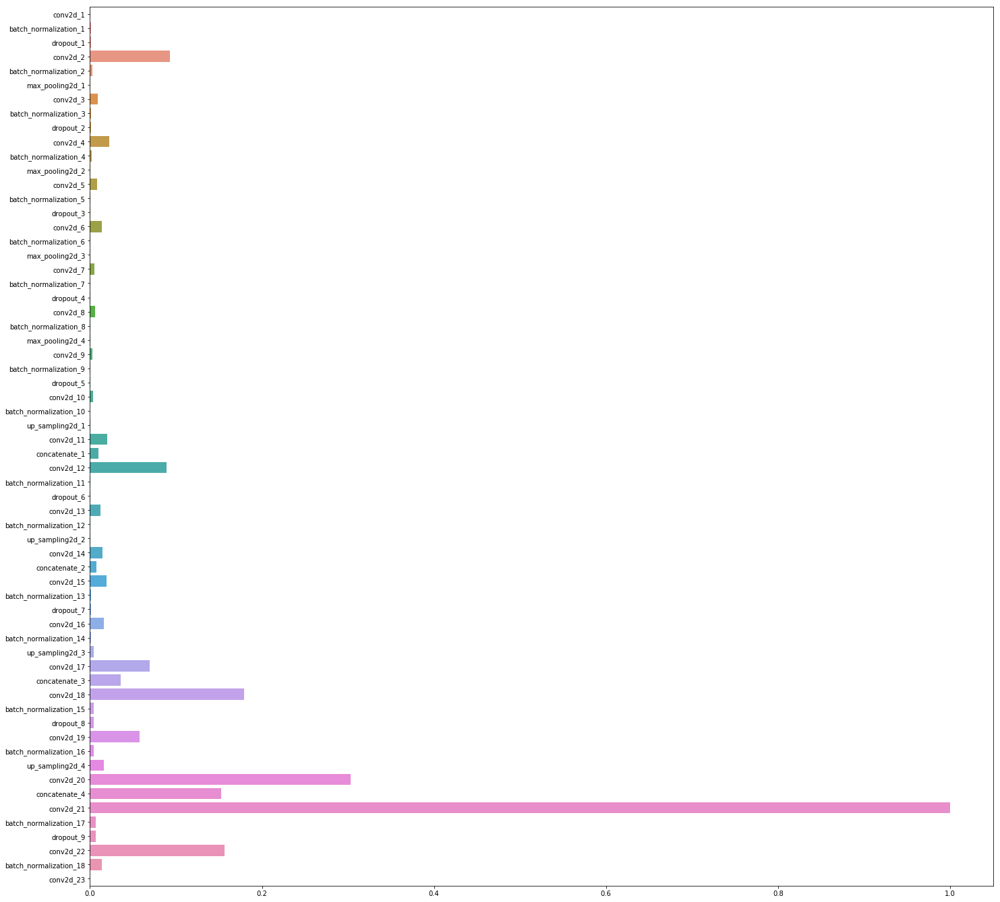

In [120]:
# zero norm
import seaborn as sns
fig, ax = plt.subplots(1,1, figsize=(24,24))
sns.barplot(diff_relative, layers)